# Correlation Analysis

In [3]:
import pandas as pd

#insert file_path for the data
file_path = 'C:/Users/anton/Documents/2de_master/Thesis/Code/analysis/Code/Airbnb_Spatiotemporal_Analysis/Paris Airbnb_Spatiotemporal_Analysis/Adding features, Merging datasets, Feature engineering/Merged_Engineered_Dataset.xlsx'
#read data, and quickly check if it is correctly read in
data_copy= pd.read_excel(file_path)

price                       1.000000
accommodates                0.389247
bathrooms                   0.372042
bedrooms                    0.356620
availability_365            0.343493
                              ...   
Arc de Triomphe Distance   -0.218703
host_response_rate         -0.223110
Eiffel Tower Distance      -0.233120
Louvre Museum Distance     -0.236249
property_type_Apartment    -0.244075
Name: price, Length: 179, dtype: float64


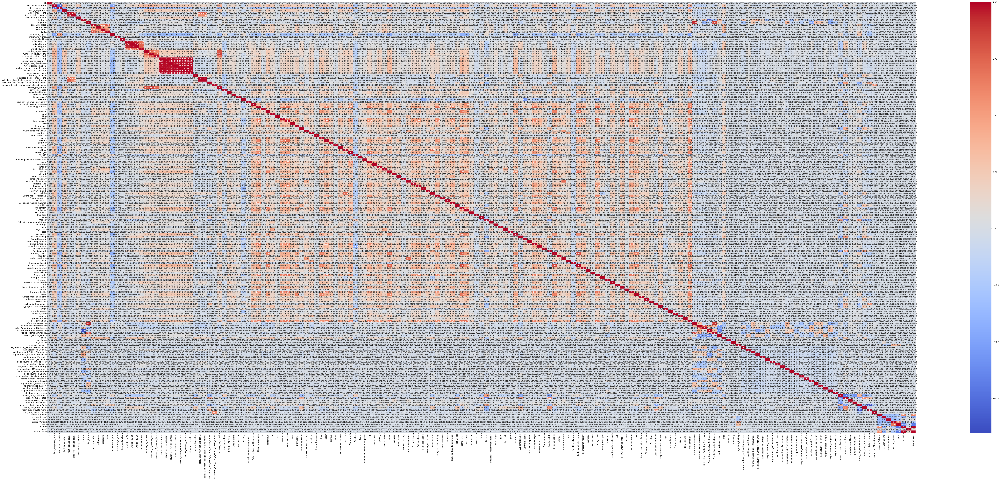

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'target_column' with your actual target variable
target = 'price'

# Correlation for numerical features
correlation_matrix = data_copy.corr()
correlation_with_target = correlation_matrix[target].sort_values(ascending=False)

# Display the correlations
print(correlation_with_target)

# Visualize the correlations with a heatmap
plt.figure(figsize=(100, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [7]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import numpy as np

# Assuming data_copy_clean is your DataFrame
# Ensure that only numeric data is used for VIF calculation
numeric_data = data_copy.select_dtypes(include=[np.number])

# Adding a constant column for intercept
numeric_data_with_constant = add_constant(numeric_data)

# Sampling 40% of the data for performance reasons
sampled_data = numeric_data_with_constant.sample(frac=0.4, random_state=42)

# Calculating VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = sampled_data.columns
vif_data["VIF"] = [variance_inflation_factor(sampled_data.values, i) for i in range(sampled_data.shape[1])]

print(vif_data)

C:\Users\anton\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1781: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


                                         Feature           VIF
0                                          const  0.000000e+00
1                                             id  1.015297e+00
2                             host_response_time  1.591027e+00
3                             host_response_rate  1.552787e+00
4                            host_listings_count  2.316340e+01
5                      host_total_listings_count  3.635268e+00
6                                       latitude  9.772131e-01
7                                      longitude  1.081489e+00
8                                   accommodates  1.207185e+00
9                                      bathrooms  1.176757e+00
10                                      bedrooms  1.183928e+00
11                                          beds  1.147149e+00
12                                minimum_nights  1.138086e+00
13                                maximum_nights  1.000073e+00
14                               availability_30  2.156

In [8]:
# Filter and display features with VIF greater than 5
high_vif_features = vif_data[vif_data["VIF"] > 5]
print("Features with VIF greater than 5:\n", high_vif_features)

Features with VIF greater than 5:
                 Feature         VIF
4   host_listings_count   23.163401
44                month  141.585490


In [9]:
import pandas as pd

# Load your data
data = data_copy.copy()

# Calculate the correlation matrix
corr_matrix = data.corr()

# Identify features correlated with the target variable
target_variable = 'price'  # Replace with your actual target variable name
correlation_with_target = corr_matrix[target_variable].abs().sort_values(ascending=False)

# Selecting the top 10 features most correlated to the target, excluding the target itself
top_10_correlated_features = correlation_with_target[1:11]  # Skip the first one as it's the target itself

# Displaying the top 10 correlated features
print("Top 10 features most correlated with the target variable:")
print(top_10_correlated_features)

Top 10 features most correlated with the target variable:
accommodates           0.389247
bathrooms              0.372042
bedrooms               0.356620
availability_365       0.343493
beds                   0.343035
Air conditioning       0.322985
crib                   0.321588
property_type_Hotel    0.312695
total_amenities        0.290608
host_response_time     0.290252
Name: price, dtype: float64


In [10]:
import pandas as pd

# Load your data
data = data_copy.copy()

# Calculate the correlation matrix
corr_matrix = data.corr()

# Identify features correlated with the target variable
target_variable = 'price'  # Replace with your actual target variable name
correlation_with_target = corr_matrix[target_variable].abs().sort_values(ascending=True)

# Selecting the 10 features least correlated to the target, excluding the target itself
bottom_10_correlated_features = correlation_with_target[1:11]  # Skip the first one as it's the target itself

# Displaying the 10 least correlated features
print("10 features least correlated with the target variable:")
print(bottom_10_correlated_features)

10 features least correlated with the target variable:
Cleaning available during stay    0.000474
day                               0.000961
Portable heater                   0.001171
weekday                           0.001742
maximum_nights                    0.003588
month                             0.003593
day_of_year                       0.003612
season_Summer                     0.006084
has_availability                  0.006642
is_school_holiday                 0.008157
Name: price, dtype: float64


In [11]:
# Set a threshold for identifying high correlations (e.g., 0.8 or 0.9)
high_corr_threshold = 0.8


# Calculate the correlation matrix
corr_matrix = data_copy.corr()

# Find pairs of highly correlated features
high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > high_corr_threshold:
            high_corr_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))

# Print out the highly correlated pairs
for pair in high_corr_pairs:
    print(f"Feature pair: {pair[0]}, {pair[1]} - Correlation: {pair[2]:.2f}")

Feature pair: host_listings_count, host_total_listings_count - Correlation: 0.94
Feature pair: latitude, Sacré-Cœur Basilica Distance - Correlation: -0.88
Feature pair: longitude, Eiffel Tower Distance - Correlation: 0.93
Feature pair: longitude, Arc de Triomphe Distance - Correlation: 0.85
Feature pair: accommodates, beds - Correlation: 0.80
Feature pair: availability_30, availability_60 - Correlation: 0.96
Feature pair: availability_30, availability_90 - Correlation: 0.93
Feature pair: availability_60, availability_90 - Correlation: 0.99
Feature pair: number_of_reviews_ltm, reviews_per_month - Correlation: 0.87
Feature pair: review_scores_rating, review_scores_accuracy - Correlation: 0.99
Feature pair: review_scores_rating, review_scores_cleanliness - Correlation: 0.99
Feature pair: review_scores_rating, review_scores_checkin - Correlation: 0.98
Feature pair: review_scores_rating, review_scores_communication - Correlation: 0.99
Feature pair: review_scores_rating, review_scores_locati

In [12]:
#to many missing values in these columns, thus removing them
columns_to_drop = ['review_scores_accuracy',"review_scores_cleanliness","review_scores_checkin","review_scores_communication"
                  ,"review_scores_location","review_scores_value","Dishes and silverware","host_listings_count","calculated_host_listings_count_entire_homes"
                  ,"availability_30","availability_60","number_of_reviews_ltm"]

data_copy = data_copy.drop(columns_to_drop, axis=1)

In [13]:
data_copy.to_excel('FINAL_MERGED_DATASET.xlsx', index=False)